# ADS-A Project
### Group A

## Data Cleaning

In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image 
import pydotplus
import pylab as pyl
from sklearn import tree
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn import tree
from sklearn import metrics
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
import matplotlib.pyplot as plt
import seaborn as sn
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, KFold
from scipy.stats import sem
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report, confusion_matrix

In [4]:

df = pd.read_csv(r'C:/Users/Bilal Aktas/Desktop/Git Lab/Fontys/Fontys Subjects/Semester 4/Applied Data Science A/Project/Dataset/ds.csv', 
                 names = ['Delivery date', 'Delivery time', 'Pharmacy number', 'Pharmacy Postcode' , 'Year of birth' , 'Gender', 'CNK', 'Product name' , 'ATC', 'Units', 'Price', 'Contribution'])      


In [5]:
df

,Delivery date,Delivery time,Pharmacy number,Pharmacy Postcode,Year of birth,Gender,CNK,Product name,ATC,Units,Price,Contribution
0,01/01/2017,00:00,7341765,21,1924,1,1715119,AMOXICLAV SANDOZ 500MG/125 MG COMP 30,J01CR02,30,14.81,3.47
1,01/01/2017,00:00,7341765,21,1922,1,5520523,WACHTHONORARIUM,,0,4.90,0.00
2,01/01/2017,00:00,7341765,21,1925,1,1799931,"ZALDIAR 37,5 MG/325 MG FILMOMH TABL 20",N02AJ13,20,9.26,3.62
3,01/01/2017,00:00,8272695,16,1932,2,1719400,VASEXTEN CAPS BLIST 28 X 10 MG,C08CA12,28,19.22,4.98
4,01/01/2017,00:00,8272695,16,1933,2,5520523,WACHTHONORARIUM,,0,4.90,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...
22705343,12/31/2019,23:56,7068483,90,1963,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705344,12/31/2019,23:56,7068483,90,1962,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705345,12/31/2019,23:56,7068483,90,1961,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705346,12/31/2019,23:56,7068483,90,1962,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00


The ATC code we are going to work with will be the first 4 letters based on this website https://www.atccode.com/ so we create a new column with the first 4 letters in the ATC code. 

In [6]:
df['ATCShort'] = df['ATC'].str[:4]

In [7]:
df.head()

,Delivery date,Delivery time,Pharmacy number,Pharmacy Postcode,Year of birth,Gender,CNK,Product name,ATC,Units,Price,Contribution,ATCShort
0,01/01/2017,00:00,7341765,21,1924,1,1715119,AMOXICLAV SANDOZ 500MG/125 MG COMP 30,J01CR02,30,14.81,3.47,J01C
1,01/01/2017,00:00,7341765,21,1922,1,5520523,WACHTHONORARIUM,,0,4.90,0.00,
2,01/01/2017,00:00,7341765,21,1925,1,1799931,"ZALDIAR 37,5 MG/325 MG FILMOMH TABL 20",N02AJ13,20,9.26,3.62,N02A
3,01/01/2017,00:00,8272695,16,1932,2,1719400,VASEXTEN CAPS BLIST 28 X 10 MG,C08CA12,28,19.22,4.98,C08C
4,01/01/2017,00:00,8272695,16,1933,2,5520523,WACHTHONORARIUM,,0,4.90,0.00,


The are unknown genders which are 0 and 3 which are invalid data that we cannot use because we do not know what they respresent.
Because knowing the gender of a customer is important, the solution we are going with will be to remove the rows that have these genders.

In [8]:
indexNames = df[ df['Gender'] == 0 ].index
df.drop(indexNames , inplace=True)
indexNames = df[ df['Gender'] == 3 ].index
df.drop(indexNames , inplace=True)

There is a delivery time column which only has the time for around 1% of the whole dataset so we will not be able to use it.
We will therefore remove it from our dataset to avoid complications.

In [9]:
df = df.drop(columns=['Delivery time'])

There are a few rows with empty ATC code which means the medicine is unknown so we cannot use those fields. Because there are not many missing values, we will remove them from the dataset.

In [10]:
indexNames = df[ df['ATC'] == ' ' ].index
df.drop(indexNames , inplace=True)

We will also remove the price and units where it is 0 as those are not valid data we could use.

In [11]:
indexNames = df[ df['Price'] == 0 ].index
df.drop(indexNames , inplace=True)

indexNames = df[ df['Units'] == 0 ].index
df.drop(indexNames , inplace=True)

We will need to later use the price per unit of medicine so we will create a new column that shows the price per unit. This is the price divided by the units.

In [12]:
df['Price per unit'] = df['Price']/df['Units']
df['Price per unit'] = round(df['Price per unit'],2)

In [13]:
df.head()

,Delivery date,Pharmacy number,Pharmacy Postcode,Year of birth,Gender,CNK,Product name,ATC,Units,Price,Contribution,ATCShort,Price per unit
0,01/01/2017,7341765,21,1924,1,1715119,AMOXICLAV SANDOZ 500MG/125 MG COMP 30,J01CR02,30,14.81,3.47,J01C,0.49
2,01/01/2017,7341765,21,1925,1,1799931,"ZALDIAR 37,5 MG/325 MG FILMOMH TABL 20",N02AJ13,20,9.26,3.62,N02A,0.46
3,01/01/2017,8272695,16,1932,2,1719400,VASEXTEN CAPS BLIST 28 X 10 MG,C08CA12,28,19.22,4.98,C08C,0.69
5,01/01/2017,9111423,10,1931,1,1750132,AACIDEXAM 5MG/ML OPL INJ FL INJ 1 X 1ML,H02AB02,1,6.15,0.39,H02A,6.15
6,01/01/2017,8272695,10,1933,1,1750132,AACIDEXAM 5MG/ML OPL INJ FL INJ 1 X 1ML,H02AB02,1,6.15,0.39,H02A,6.15


Checking for null value in the dataset.

In [14]:
print(df.isnull().sum())

Delivery date        0
Pharmacy number      0
Pharmacy Postcode    0
Year of birth        0
Gender               0
CNK                  0
Product name         0
ATC                  0
Units                0
Price                0
Contribution         0
ATCShort             0
Price per unit       0
dtype: int64


As the the data is too big, we will work with one type of medicine with a specific ATC code, we will filter it to only medicines with ATC code "J01C". Furthermore, we will also filter the age from 18 to 80 years old so data with year of birth of 1940 to 2002 only. This is a test to see if the script would run with less data and to see if using only one medicine type is possible.

In [15]:
isMedicine = df['ATCShort'] == 'J01C'
df_filter = df[isMedicine]
df_filter = df_filter[df_filter['Year of birth'].between(1940, 2002)]

In [16]:
df_filter.head()

,Delivery date,Pharmacy number,Pharmacy Postcode,Year of birth,Gender,CNK,Product name,ATC,Units,Price,Contribution,ATCShort,Price per unit
13,01/01/2017,8272695,21,1955,2,29025,AUGMENTIN COMP 16 X 500MG,J01CR02,16,11.27,2.20,J01C,0.70
17,01/01/2017,7341765,21,1957,1,2744761,AMOXICILLINE EG 1000 MG FILMOMH TABL 24 X 1000 MG,J01CA04,24,14.73,3.43,J01C,0.61
22,01/01/2017,7641438,40,1961,1,1458736,AUGMENTIN 875 MG COMP 10X875MG,J01CR02,10,10.14,1.14,J01C,1.01
23,01/01/2017,7341765,16,1963,1,1715119,AMOXICLAV SANDOZ 500MG/125 MG COMP 30,J01CR02,30,14.81,3.47,J01C,0.49
32,01/01/2017,7641438,40,1967,1,1525500,AMOXICILLINE SANDOZ 500 MG TABL DISP 16,J01CA04,16,7.06,0.79,J01C,0.44


## Exploratory Data Analysis

As mentioned before, the data is too big so the target variable will be the price of medicines with ATC code "J01C".
First we look at some scatterplot matrix with different features. Contribution while not perfect, seems to be the most appropriate for a linear regressor.

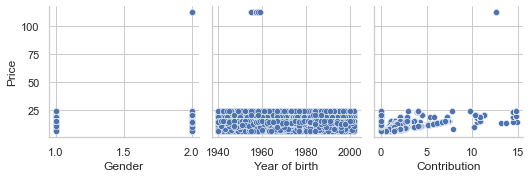

In [17]:
sns.set(style='whitegrid', context='notebook')
sns.pairplot(df_filter, x_vars=['Gender','Year of birth','Contribution'], y_vars=['Price']);
plt.show()

We want to check the correlation between some of the features with price so we will use the Pearson product-moment correlation to analyse a possible correlation. We use a heatmap to visualize the correlation.
Here the correlation between price and year of birth has the strongest negative relation with gender follows closely.
As expected from the scatterplot from before, contribution has the highest positive relation with price.

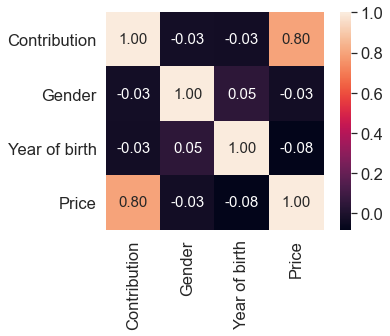

In [18]:
cols = ['Contribution', 'Gender', 'Year of birth', 'Price']
cm = np.corrcoef(df_filter[cols].values, rowvar=0)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 15},
    yticklabels=cols,
    xticklabels=cols)
plt.show()

Now we will try to use more ATC codes instead of only J01C for more data.

By determining the top 10 sold medicines, we can determine which ATC Code is the most useful for our data analysis. In this case, you can see from the chart below that A02B, C07A and A10B are the most sold.
We will try some classification models so we will use only 3 types of medicines based on the ATC code which are 'A02B', 'C07A' and'A10B' as the data is too large and these 3 are the most sold and would provide us with the most data.

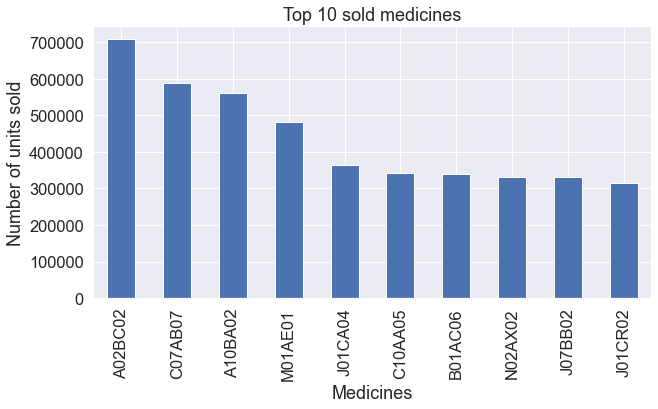

In [19]:
df['ATC'].value_counts().nlargest(10).plot(kind='bar', figsize=(10,5))
plt.title("Top 10 sold medicines")
plt.ylabel('Number of units sold')
plt.xlabel('Medicines');

In [20]:
tempMed = ['A02B', 'C07A', 'A10B']
df['ATCShort'].isin(tempMed)
med_filter = df[df['ATCShort'].isin(tempMed)]

med_filter['ATCShort_int'] = med_filter['ATCShort'].map({'A02B': 0, 'C07A': 1, 'A10B': 2})

<ipython-input-20-2c6fbd9279c3>:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



We will try to use contribution for a linear regression model so we will take a closer look at the correlation between contribution and price. The resulting scatter graph shows that the contribution increases with the price. These are only for the 3 values we use as example which are 'J01C', 'N02A' and 'C08C'.

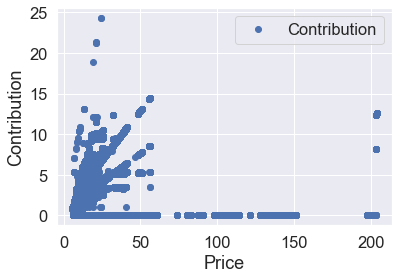

In [21]:
med_filter.plot(x='Price', y='Contribution', style='o')
plt.xlabel('Price')
plt.ylabel('Contribution')
plt.show()

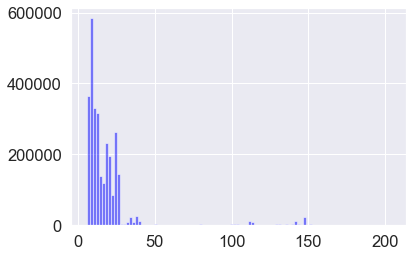

In [22]:
import numpy as np
import matplotlib.mlab as mlab
import matplotlib.pyplot as plt

x = med_filter['Price']
num_bins = 100
n, bins, patches = plt.hist(x, num_bins, facecolor='blue', alpha=0.5)
plt.show()

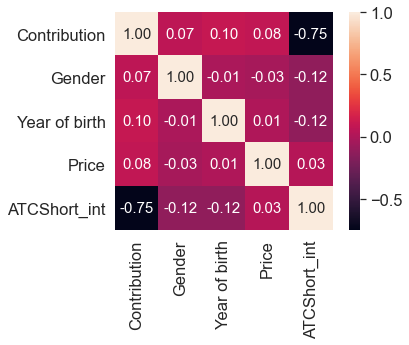

In [23]:
cols = ['Contribution', 'Gender', 'Year of birth', 'Price', 'ATCShort_int']
cm = np.corrcoef(med_filter[cols].values, rowvar=0)
sns.set(font_scale=1.5)
hm = sns.heatmap(cm,
    cbar=True,
    annot=True,
    square=True,
    fmt='.2f',
    annot_kws={'size': 15},
    yticklabels=cols,
    xticklabels=cols)
plt.show()

types: [0 2 1]
The length of X: 2969962


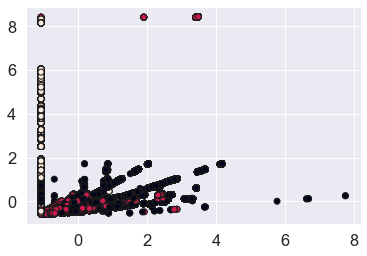

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn import metrics

X = med_filter[['Contribution', 'Price']]
y = med_filter['ATCShort_int']
print('types:', med_filter['ATCShort_int'].unique())

scaler = StandardScaler().fit(X)
X = scaler.transform(X)
print('The length of X: {}'.format(len(X)))

plt.scatter(X[:,0], X[:,1], edgecolors='k', c=y)

In [25]:
from sklearn.linear_model import LinearRegression
import matplotlib.pyplot as plt

X = med_filter[['Contribution']].values
Y = med_filter['Price'].values

slr = LinearRegression()
slr.fit(X, Y)
print('Slope: %.3f' % slr.coef_[0])
print('Intercept: %.3f' % slr.intercept_)

Slope: 0.656
Intercept: 16.797


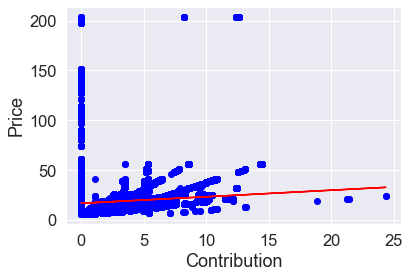

In [26]:
# Plotting a scatter graph with a linear line superimposed on it.
def lin_regplot(X, Y, model):
    plt.scatter(X, Y, c='blue')
    plt.plot(X, model.predict(X), color='red')    
    return None

lin_regplot(X, Y, slr)
plt.xlabel('Contribution')
plt.ylabel('Price')
plt.show()

Price = 11.575 + 1.594*Contribution

In [27]:
slr.predict(X)

array([18.63293795, 18.63293795, 18.63293795, ..., 17.51801219,
       16.79658964, 16.79658964])

In [28]:
new_X = [[100]]
print(slr.predict(new_X))

[82.38045789]


In [29]:

HEIGHT = 500
WIDTH = 700
NBINS = 50
SCATTER_SIZE=700

def plot_histogram(dataframe, column, color, bins, title, width=WIDTH, height=HEIGHT):
    figure = px.histogram(
        dataframe,
        column,
        color=color,
        nbins=bins,
        title=title,
        width=width,
        height=height
    )
    figure.show()
plot_histogram(df_filter, 'Price per unit', 'Contribution', NBINS, 'Patients age distribution')


In [35]:
df_sym = pd.read_csv('./fd-export.csv', low_memory=False)

FileNotFoundError: [Errno 2] No such file or directory: './fd-export.csv'

In [33]:
df_sym

,01/01/2017,00:00,7341765,21,1924,1,1715119,AMOXICLAV SANDOZ 500MG/125 MG COMP 30,J01CR02,30,14.81,3.47
0,01/01/2017,00:00,7341765,21,1922,1,5520523,WACHTHONORARIUM,,0,4.90,0.00
1,01/01/2017,00:00,7341765,21,1925,1,1799931,"ZALDIAR 37,5 MG/325 MG FILMOMH TABL 20",N02AJ13,20,9.26,3.62
2,01/01/2017,00:00,8272695,16,1932,2,1719400,VASEXTEN CAPS BLIST 28 X 10 MG,C08CA12,28,19.22,4.98
3,01/01/2017,00:00,8272695,16,1933,2,5520523,WACHTHONORARIUM,,0,4.90,0.00
4,01/01/2017,00:00,9111423,10,1931,1,1750132,AACIDEXAM 5MG/ML OPL INJ FL INJ 1 X 1ML,H02AB02,1,6.15,0.39
...,...,...,...,...,...,...,...,...,...,...,...,...
22705342,12/31/2019,23:56,7068483,90,1963,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705343,12/31/2019,23:56,7068483,90,1962,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705344,12/31/2019,23:56,7068483,90,1961,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00
22705345,12/31/2019,23:56,7068483,90,1962,2,2139137,FLOCATH QUICK SONDE INTERM.+AUTOLUB. CH14 20CM 30,,0,81.81,0.00


In [34]:
indexNames = df_sym[ df_sym['country'] != 'BE' ].index
df_sym.drop(indexNames , inplace=True)

KeyError: 'country'

In [ ]:
df_sym

In [ ]:
##Create an array or dataframe with the dates and the count of user ids for that date.
fig = px.line(df_sym, x="checkin_date", y='user_id', title='Symptoms over time')
fig.show()

In [ ]:
df_trend = pd.read_csv('./multiTimeline.csv')


In [ ]:
fig = px.line(df_trend, x="Month", y='pharmacy: (Belgium)', title='Symptoms over time')
fig.show()

In [ ]:
# ARMA example
from statsmodels.tsa.arima_model import ARMA
from random import random
# contrived dataset
data = [random() for x in range(1, 100)]
# fit model
model = ARMA(data, order=(2, 1))
model_fit = model.fit(disp=False)
# make prediction
yhat = model_fit.predict(len(data), len(data))
print(yhat)